In [ ]:
!nvidia-smi


Thu Feb  5 03:43:43 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   49C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install ultralytics opencv-python folium pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 27.7 MB/s eta 0:00:00


In [ ]:
import cv2
import os
import pandas as pd
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
pip install ultralytics


In [ ]:
!unzip /content/pothole_dataset.zip


Archive:  /content/pothole_dataset.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 extracting: test/images/img-195_jpg.rf.f77a8f4d432a9a89235168ff8e09a650.jpg  
 extracting: test/images/img-196_jpg.rf.c1e105382a0bb8d329959cea45173cdf.jpg  
 extracting: test/images/img-217_jpg.rf.20e267cdb167c43140e67ec9f5328040.jpg  
 extracting: test/images/img-238_jpg.rf.f146df7999e374dbeaba65f92c518159.jpg  
 extracting:

In [ ]:
!ls

data.yaml  pothole_dataset.zip	README.roboflow.txt  test   valid
drive	   README.dataset.txt	sample_data	     train


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="/content/data.yaml",
    epochs=50,
    imgsz=640
)


Ultralytics 8.4.11 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e1fc4926e70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
!ls runs/detect/train/weights

best.pt  last.pt


In [ ]:
model = YOLO("/content/runs/detect/train/weights/best.pt")

model.predict(
    source="/content/test/images",
    conf=0.4,
    save=True
)


image 1/66 /content/test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg: 640x640 2 potholes, 7.2ms
image 2/66 /content/test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg: 640x640 1 pothole, 7.2ms
image 3/66 /content/test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg: 640x640 1 pothole, 7.2ms
image 4/66 /content/test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg: 640x640 3 potholes, 7.2ms
image 5/66 /content/test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg: 640x640 4 potholes, 7.2ms
image 6/66 /content/test/images/img-195_jpg.rf.f77a8f4d432a9a89235168ff8e09a650.jpg: 640x640 5 potholes, 7.2ms
image 7/66 /content/test/images/img-196_jpg.rf.c1e105382a0bb8d329959cea45173cdf.jpg: 640x640 2 potholes, 7.2ms
image 8/66 /content/test/images/img-217_jpg.rf.20e267cdb167c43140e67ec9f5328040.jpg: 640x640 1 pothole, 7.2ms
image 9/66 /content/test/images/img-238_jpg.rf.f146df7999e374dbeaba65f92c518159.jpg: 640x640 2 potholes, 7.2ms
ima

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'pothole'}
 obb: None
 orig_img: array([[[ 88, 104, 111],
         [ 58,  74,  81],
         [ 79,  97, 104],
         ...,
         [158, 185, 205],
         [158, 185, 205],
         [159, 186, 206]],
 
        [[ 63,  82,  89],
         [ 61,  80,  87],
         [ 74,  93, 100],
         ...,
         [137, 164, 184],
         [136, 163, 183],
         [136, 163, 183]],
 
        [[ 58,  84,  90],
         [ 62,  88,  94],
         [ 47,  73,  79],
         ...,
         [130, 157, 177],
         [132, 159, 179],
         [135, 162, 182]],
 
        ...,
 
        [[132, 157, 177],
         [139, 166, 186],
         [ 73, 100, 120],
         ...,
         [104, 134, 153],
         [ 93, 123, 142],
         [ 90, 120, 139]],
 
        [[ 96, 120, 140],
         [104, 129, 149],
         [ 69,  94, 114],
         ...,
         [108, 13

In [ ]:
import os
from IPython.display import Image, display

folder = "/content/runs/detect"

for file in os.listdir(folder):
    if file.endswith(".jpg"):
        display(Image(filename=os.path.join(folder, file)))


In [ ]:
import os
from IPython.display import display, Image

folder = "/content/runs/detect"  # change to predict2 if needed

files = os.listdir(folder)
print("Files found:", files)

for file in files:
    if file.lower().endswith((".jpg", ".png", ".jpeg")):
        display(Image(filename=os.path.join(folder, file)))


Files found: ['predict4', 'train', 'predict2', 'predict5', 'predict3', 'predict6', 'predict']


In [ ]:
!ls /content/runs/detect/predict


img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg
img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg
img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg
img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg
img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg
img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg
img-195_jpg.rf.f77a8f4d432a9a89235168ff8e09a650.jpg
img-196_jpg.rf.c1e105382a0bb8d329959cea45173cdf.jpg
img-217_jpg.rf.20e267cdb167c43140e67ec9f5328040.jpg
img-238_jpg.rf.f146df7999e374dbeaba65f92c518159.jpg
img-23_jpg.rf.e6aa0daf83e72ccbf1ea10eb6a6ab3bd.jpg
img-245_jpg.rf.1c9b49a366bda1cf64dbfac2a946cd38.jpg
img-264_jpg.rf.a98f3f39b1afdea9ce3155bbe107c6c1.jpg
img-269_jpg.rf.f51d9eb8d02a34ac01d4a486cbfbdd4f.jpg
img-276_jpg.rf.acc167b63d79ab3b99fd64b4109f86d4.jpg
img-282_jpg.rf.a0ac2a228cf0edb961017e538356b5af.jpg
img-294_jpg.rf.a16953e9091e3eecfc338ed3044ef294.jpg
img-300_jpg.rf.6b7b035dff1cda092ce3dc22be8d0135.jpg
img-307_jpg.rf.65a7065124972969c3efbbca04122668.jpg
img-308_jpg.r

Files inside predict folder: ['img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg', 'img-72_jpg.rf.02fb39f41fc685d8b616b0751976a8a3.jpg', 'img-195_jpg.rf.f77a8f4d432a9a89235168ff8e09a650.jpg', 'img-394_jpg.rf.2182e193f33ed5bcce45df7df27032f7.jpg', 'img-282_jpg.rf.a0ac2a228cf0edb961017e538356b5af.jpg', 'img-269_jpg.rf.f51d9eb8d02a34ac01d4a486cbfbdd4f.jpg', 'img-44_jpg.rf.c0be863d6030f5d0cb241331c14ee532.jpg', 'img-98_jpg.rf.667209472947ff4d519f65c6e206a7c3.jpg', 'img-634_jpg.rf.42d6e4ebdda859ab935130b75ae5808f.jpg', 'img-621_jpg.rf.9721804149e82d9ebc58f8d19a01d044.jpg', 'img-370_jpg.rf.05c61289bcb823fd9234f20448a9ff3a.jpg', 'img-36_jpg.rf.47f0fb502327ec69d5a041581727a149.jpg', 'img-390_jpg.rf.3eeb4356ab769c112edf7f482110f8ee.jpg', 'img-525_jpg.rf.31bb542f59dd1c64d4af0952f14c76e3.jpg', 'img-334_jpg.rf.967014f8076ad78a0828aa4cb9014da2.jpg', 'img-371_jpg.rf.a893e0bdc6fda0ba1b2a7f07d56cec23.jpg', 'img-536_jpg.rf.a0b5c2d9388b4cb55785d5fa9e198a5c.jpg', 'img-82_jpg.rf.851a545b1b004e7303844e47

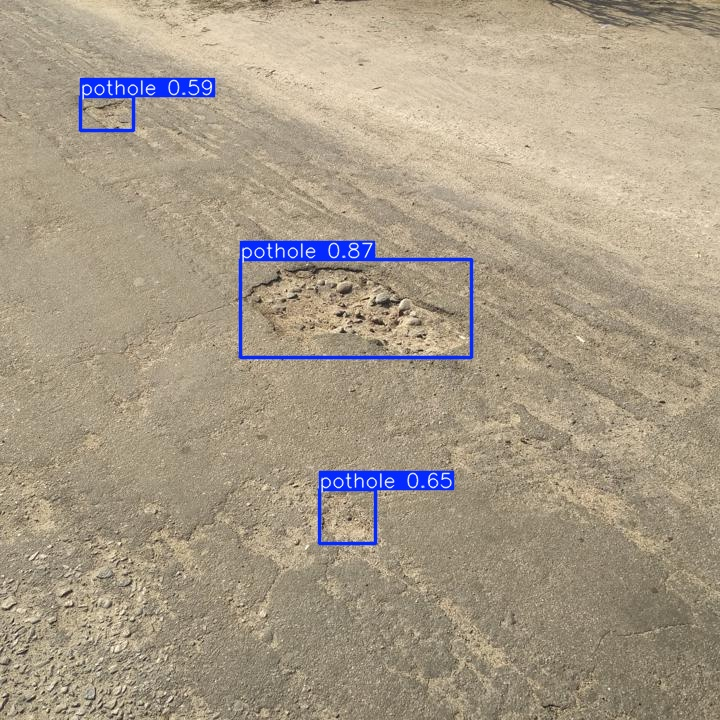

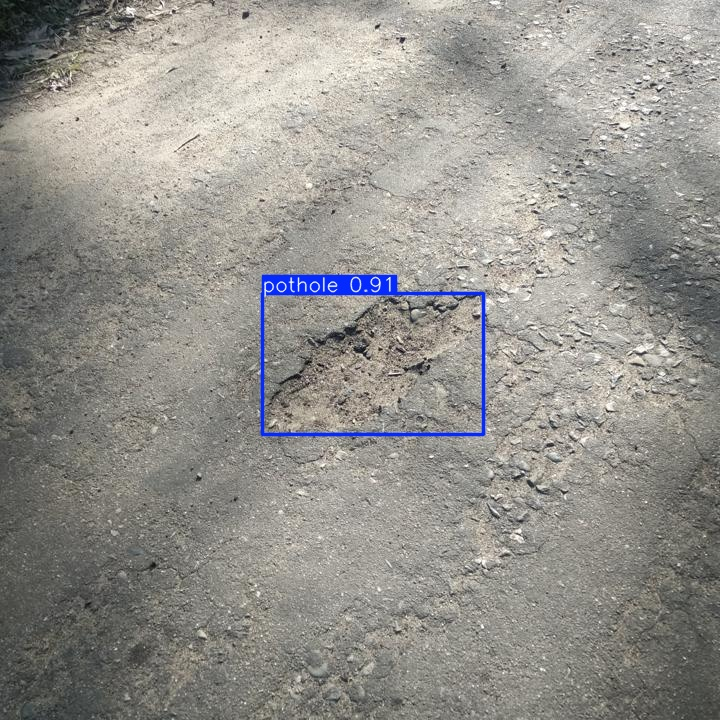

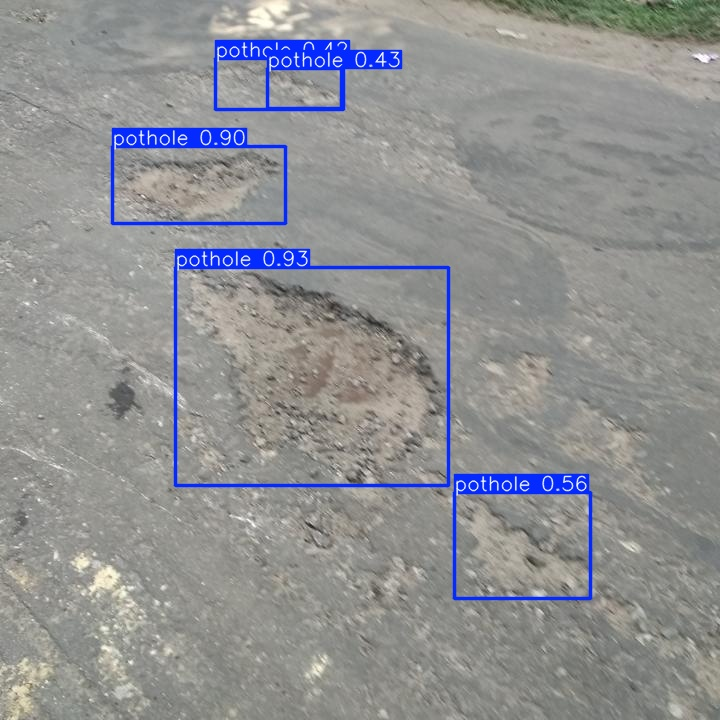

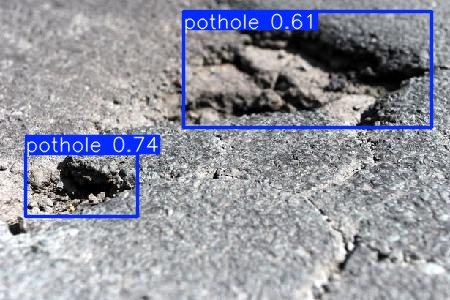

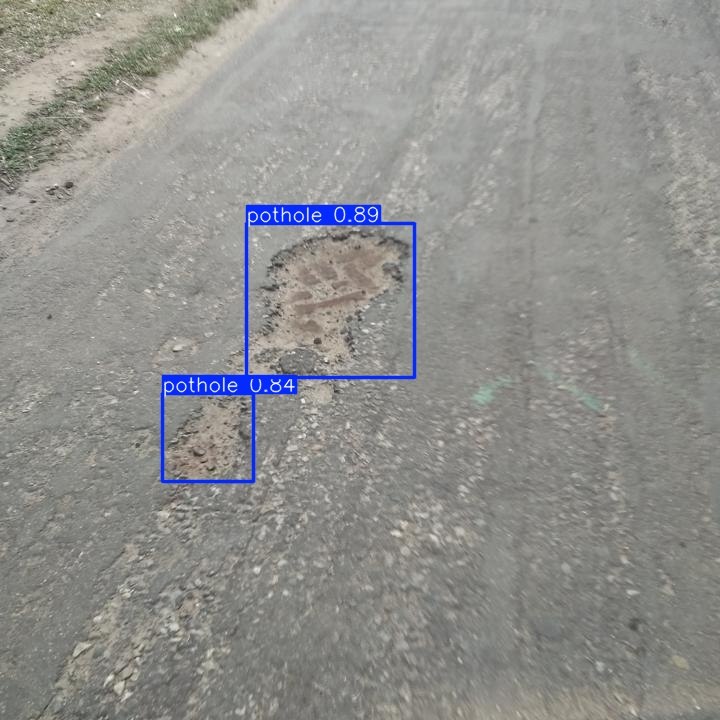

...

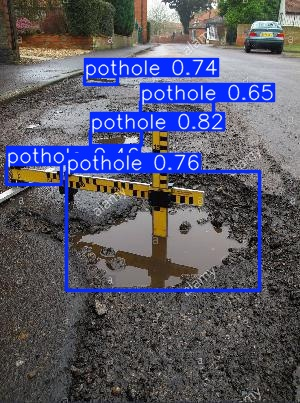

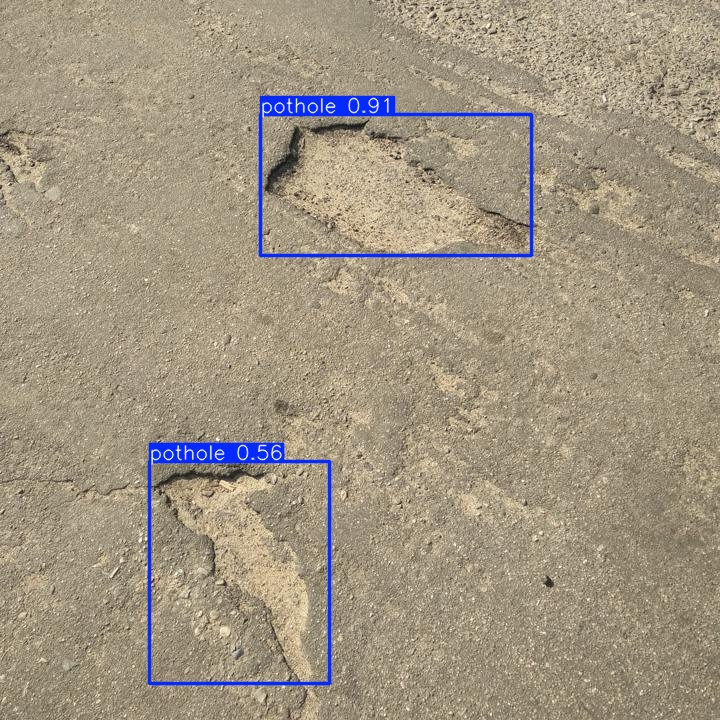

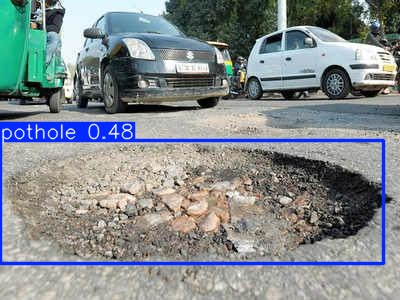

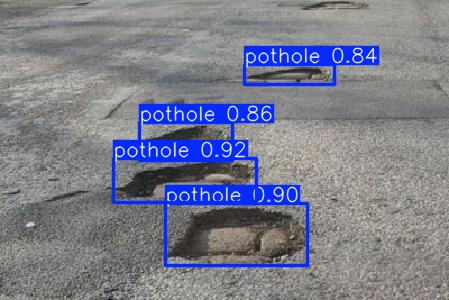

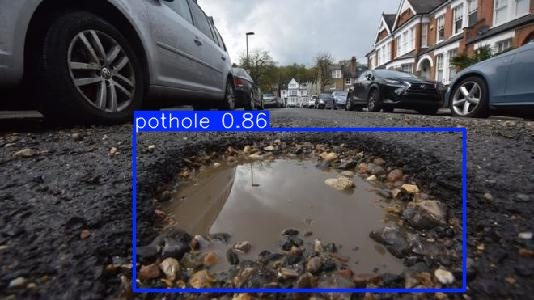

In [ ]:
import os
from IPython.display import Image, display

folder = "/content/runs/detect/predict"

files = os.listdir(folder)
print("Files inside predict folder:", files)

for file in files:
    if file.lower().endswith((".jpg", ".png", ".jpeg")):
        display(Image(filename=os.path.join(folder, file)))
